# Importing libraries to be used

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
from matplotlib import style
%matplotlib inline
import seaborn as sns
import scipy.stats as stats
from scipy.stats import chi2_contingency
import warnings
warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')

# Set display

In [6]:
pd.set_option('display.max_column',None)

# Loading the data , setting the index of preference and consider the # as a comment

In [10]:
churn_df=pd.read_csv(r"C:\Users\MALCOM_TREVOR\Desktop\DATA SCIENCE\MY PROJECT\ML\Classification Tasks\bank churn\data\bank_churn_train.csv",
                     index_col='RowNumber',comment ='#')

# Data Inspection

In [15]:
churn_df.shape

(8899, 13)

In [17]:
churn_df.head(15)

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
10,15592389,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [19]:
churn_df.tail(10)

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
8891,15788723,McIntyre,599,Germany,Female,49,10,143888.22,2,1,1,166236.38,1
8892,15790489,Lo Duca,534,Spain,Male,34,5,170600.78,1,0,1,5240.53,0
8893,15739476,Ferrari,680,France,Female,32,5,0.00,1,1,1,150684.23,0
8894,15612670,Berry,631,Spain,Female,46,10,0.00,2,1,1,129508.96,0
8895,15631222,Cattaneo,485,France,Female,39,2,75339.64,1,1,1,70665.16,0
8896,15658972,Foster,699,France,Female,40,8,122038.34,1,1,0,102085.35,0
8897,15724691,Gordon,712,France,Male,34,1,0.00,2,1,1,195052.12,0
8898,15740442,May,603,France,Male,51,8,186825.57,1,1,0,93739.71,1
8899,15760427,Cameron,850,France,Male,40,6,124788.18,1,1,0,65612.12,0


In [21]:
churn_df.columns

Index(['CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender', 'Age',
       'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited'],
      dtype='object')

In [23]:
churn_df.dtypes

CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [25]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8899 entries, 2 to 8900
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CustomerId       8899 non-null   int64  
 1   Surname          8899 non-null   object 
 2   CreditScore      8899 non-null   int64  
 3   Geography        8899 non-null   object 
 4   Gender           8899 non-null   object 
 5   Age              8899 non-null   int64  
 6   Tenure           8899 non-null   int64  
 7   Balance          8899 non-null   float64
 8   NumOfProducts    8899 non-null   int64  
 9   HasCrCard        8899 non-null   int64  
 10  IsActiveMember   8899 non-null   int64  
 11  EstimatedSalary  8899 non-null   float64
 12  Exited           8899 non-null   int64  
dtypes: float64(2), int64(8), object(3)
memory usage: 973.3+ KB


In [29]:
churn_df.isnull().sum()

CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [31]:
churn_df.duplicated().sum()

0

In [33]:
churn_df[['Age','Balance','EstimatedSalary','CreditScore']].median()

Age                    37.00
Balance             97339.99
EstimatedSalary    100447.53
CreditScore           652.00
dtype: float64

In [35]:
churn_df.describe().T.style.background_gradient(cmap = 'viridis')

,count,mean,std,min,25%,50%,75%,max
CustomerId,8899.000000,15690877.479604,71836.447935,15565701.000000,15628570.500000,15690898.000000,15753138.000000,15815690.000000
CreditScore,8899.000000,650.366558,96.863021,350.000000,583.000000,652.000000,717.000000,850.000000
Age,8899.000000,38.927632,10.464807,18.000000,32.000000,37.000000,44.000000,92.000000
Tenure,8899.000000,5.006630,2.885634,0.000000,3.000000,5.000000,7.000000,10.000000
Balance,8899.000000,76415.334069,62412.565096,0.000000,0.000000,97339.990000,127640.395000,250898.090000
NumOfProducts,8899.000000,1.532082,0.582157,1.000000,1.000000,1.000000,2.000000,4.000000
HasCrCard,8899.000000,0.702101,0.457360,0.000000,0.000000,1.000000,1.000000,1.000000
IsActiveMember,8899.000000,0.513428,0.499848,0.000000,0.000000,1.000000,1.000000,1.000000
EstimatedSalary,8899.000000,100218.509145,57502.444314,11.580000,51112.970000,100447.530000,149409.870000,199992.480000
Exited,8899.000000,0.206765,0.405008,0.000000,0.000000,0.000000,0.000000,1.000000


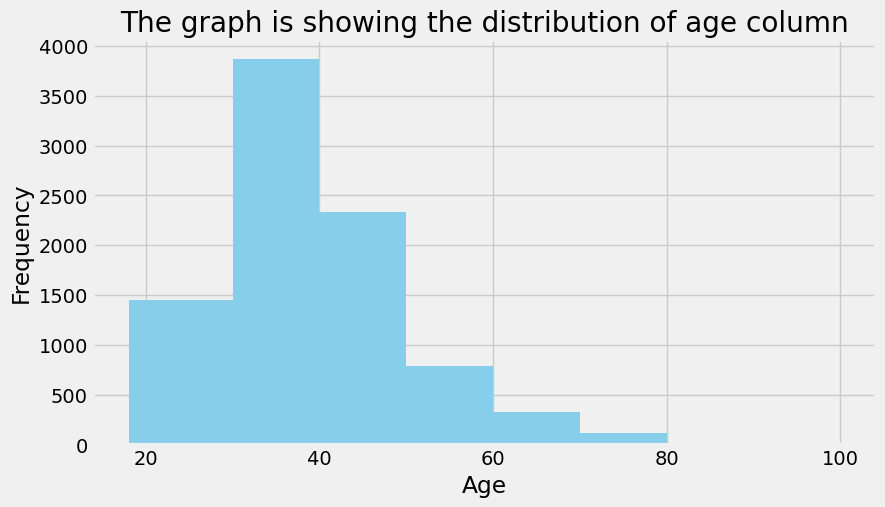

In [36]:
plt.figure(figsize=(9,5))
bins = [18,30,40,50,60,70,80,90,100]
age_plot = churn_df.Age.plot(kind='hist',title='The graph is showing the distribution of age column',color='skyblue',bins = bins)
age_plot.set_ylabel('Frequency')
age_plot.set_xlabel('Age')
plt.savefig('The graph is showing the distribution of age column')
plt.show()

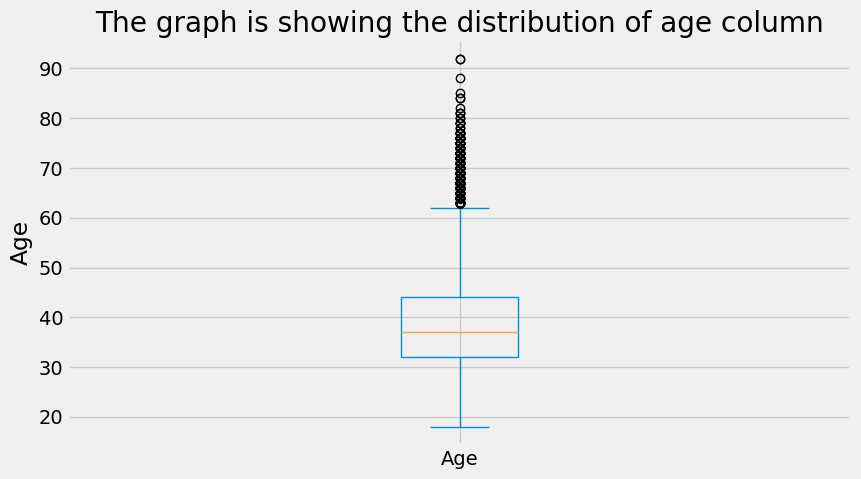

In [39]:
plt.figure(figsize=(9,5))
age_plot = churn_df.Age.plot(kind='box',title='The graph is showing the distribution of age column')#,color='khaki')
age_plot.set_ylabel('Age')
plt.show()


# Data Preprocessing and Cleaning

##### dropping irrelevant columns
##### renaming columns 
##### standardizing the values in rows 
##### converting the data types for memory efficiency 

In [44]:
churn_df.drop(columns=['CustomerId','Surname'],inplace=True)

In [46]:
churn_df=churn_df.rename(columns={'Geography':'Country_lived','Tenure':'Time_worked_with_bank(yrs)','NumOfProducts':'Products_Obtained_through_bank','EstimatedSalary':'Estimated_Salary','IsActiveMember':'Is_Active_Member','HasCrCard':'Has_CrCard'})

In [48]:
churn_df['Has_CrCard'] = churn_df['Has_CrCard'].map({1:'Yes',0:'No'}) 

In [50]:
churn_df['Is_Active_Member'] = churn_df['Is_Active_Member'].replace({1:'Yes',0:'No'}) 

In [52]:
churn_df['Exited'] = churn_df['Exited'].replace({1:'Yes',0 :'No'}) 

In [54]:
churn_df.Gender = churn_df.Gender.astype('category')

In [56]:
churn_df.Has_CrCard = churn_df.Has_CrCard.astype('category')

In [58]:
churn_df.Is_Active_Member = churn_df.Is_Active_Member.astype('category')

In [60]:
churn_df.Exited  = churn_df.Exited.astype('category')

In [62]:
churn_df.dtypes

CreditScore                          int64
Country_lived                       object
Gender                            category
Age                                  int64
Time_worked_with_bank(yrs)           int64
Balance                            float64
Products_Obtained_through_bank       int64
Has_CrCard                        category
Is_Active_Member                  category
Estimated_Salary                   float64
Exited                            category
dtype: object

 ###### AFTER SOME  FEW CHANGES

In [65]:
churn_df.head(12)

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
2,608,Spain,Female,41,1,83807.86,1,No,Yes,112542.58,No
3,502,France,Female,42,8,159660.80,3,Yes,No,113931.57,Yes
4,699,France,Female,39,1,0.00,2,No,No,93826.63,No
5,850,Spain,Female,43,2,125510.82,1,Yes,Yes,79084.10,No
6,645,Spain,Male,44,8,113755.78,2,Yes,No,149756.71,Yes
7,822,France,Male,50,7,0.00,2,Yes,Yes,10062.80,No
8,376,Germany,Female,29,4,115046.74,4,Yes,No,119346.88,Yes
9,501,France,Male,44,4,142051.07,2,No,Yes,74940.50,No
10,684,France,Male,27,2,134603.88,1,Yes,Yes,71725.73,No


In [66]:
#lower_quantile = churn_df.Age.quantile(0.25)
#upper_quantile = churn_df.Age.quantile(0.75)

#inter_quantile = upper_quantile - lower_quantile
#lower_bound = lower_quantile - 1.5 * inter_quantile
#upper_bound = upper_quantile + 1.5 * inter_quantile

#median = churn_df['Age'].median()
#churn_df.loc[churn_df['Age'] < lower_bound] = median
#churn_df.loc[churn_df['Age'] > upper_bound] = median

In [67]:
churn_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8899 entries, 2 to 8900
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CreditScore                     8899 non-null   int64   
 1   Country_lived                   8899 non-null   object  
 2   Gender                          8899 non-null   category
 3   Age                             8899 non-null   int64   
 4   Time_worked_with_bank(yrs)      8899 non-null   int64   
 5   Balance                         8899 non-null   float64 
 6   Products_Obtained_through_bank  8899 non-null   int64   
 7   Has_CrCard                      8899 non-null   category
 8   Is_Active_Member                8899 non-null   category
 9   Estimated_Salary                8899 non-null   float64 
 10  Exited                          8899 non-null   category
dtypes: category(4), float64(2), int64(4), object(1)
memory usage: 591.4+ KB


# Exploratory Data Analysis and Data Visualization

#### filtering ,aggregating,sorting ,exploration

In [74]:
churn_df['Gender'].value_counts(normalize=True)

Gender
Male      0.543881
Female    0.456119
Name: proportion, dtype: float64

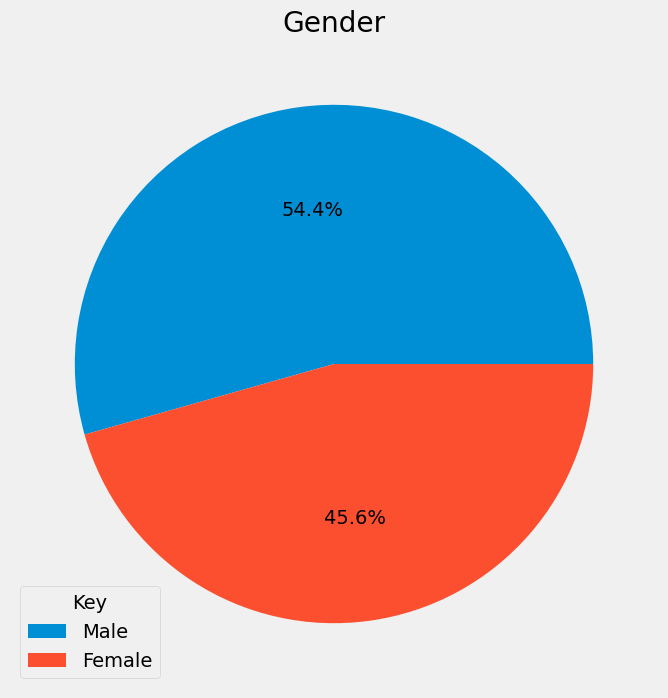

In [75]:
gender_plot=churn_df['Gender'].value_counts(normalize=True)
plt.figure(figsize=(10,8))
plt.pie(gender_plot,autopct=('%1.1f%%'))
plt.title("Gender")
plt.legend(gender_plot.index,title='Key',loc='lower left')#,bbox_to_anchor=(1,0,0.5,1))
plt.show()

In [76]:
churn_df.loc[churn_df['Gender']=='Female']

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
2,608,Spain,Female,41,1,83807.86,1,No,Yes,112542.58,No
3,502,France,Female,42,8,159660.80,3,Yes,No,113931.57,Yes
4,699,France,Female,39,1,0.00,2,No,No,93826.63,No
5,850,Spain,Female,43,2,125510.82,1,Yes,Yes,79084.10,No
8,376,Germany,Female,29,4,115046.74,4,Yes,No,119346.88,Yes
...,...,...,...,...,...,...,...,...,...,...,...
8893,680,France,Female,32,5,0.00,1,Yes,Yes,150684.23,No
8894,631,Spain,Female,46,10,0.00,2,Yes,Yes,129508.96,No
8895,485,France,Female,39,2,75339.64,1,Yes,Yes,70665.16,No


In [77]:
female_exited1=(churn_df['Gender']=='Female') & (churn_df['Exited']=='Yes')

In [78]:
churn_df.loc[female_exited1,['Gender','Exited','Time_worked_with_bank(yrs)']]

,Gender,Exited,Time_worked_with_bank(yrs)
RowNumber,,,
3,Female,Yes,8
8,Female,Yes,4
23,Female,Yes,4
31,Female,Yes,3
36,Female,Yes,0
...,...,...,...
8826,Female,Yes,9
8831,Female,Yes,6
8851,Female,Yes,5


In [79]:
churn_df.loc[female_exited1,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts()

Gender  Exited  Time_worked_with_bank(yrs)
Female  Yes     1                             117
                5                             110
                3                             107
                2                             106
                9                             101
                8                             100
                4                              97
                6                              97
                7                              91
                10                             58
                0                              51
Name: count, dtype: int64

In [80]:
female_exited=(churn_df['Gender']=='Female') & (churn_df['Exited']=='Yes') & (churn_df['Time_worked_with_bank(yrs)'] >=5)

In [81]:
churn_df.loc[female_exited,['Gender','Exited','Time_worked_with_bank(yrs)']]

,Gender,Exited,Time_worked_with_bank(yrs)
RowNumber,,,
3,Female,Yes,8
42,Female,Yes,8
47,Female,Yes,9
48,Female,Yes,9
91,Female,Yes,5
...,...,...,...
8809,Female,Yes,7
8826,Female,Yes,9
8831,Female,Yes,6


In [82]:
churn_df.loc[female_exited,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts()

Gender  Exited  Time_worked_with_bank(yrs)
Female  Yes     5                             110
                9                             101
                8                             100
                6                              97
                7                              91
                10                             58
Name: count, dtype: int64

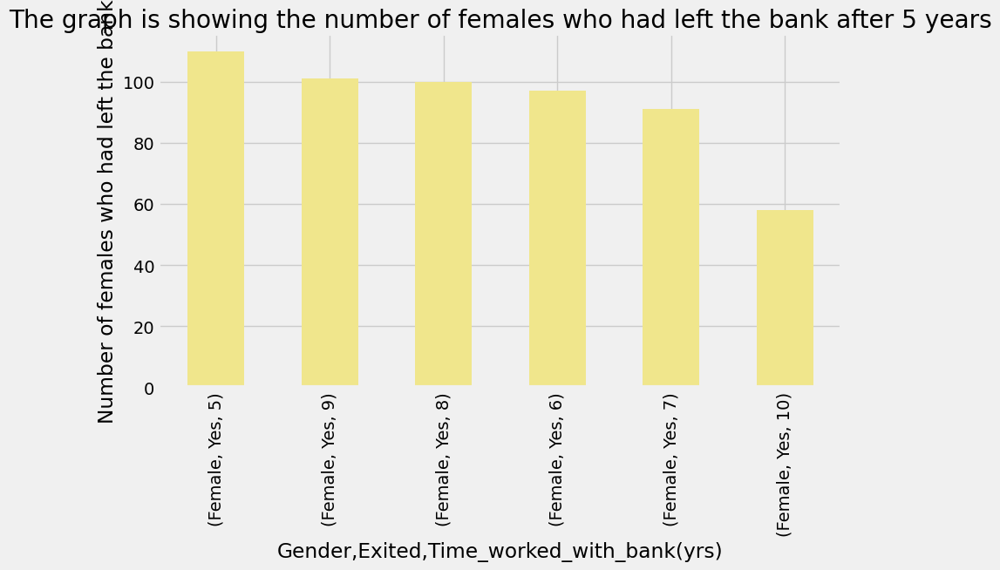

In [83]:
plt.figure(figsize=(9,5))
ax=churn_df.loc[female_exited,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts().plot(kind='bar',title='The graph is showing the number of females who had left the bank after 5 years',color='khaki')
ax.set_ylabel('Number of females who had left the bank')
plt.show()

In [84]:
female_exited2=(churn_df['Gender']=='Female') & (churn_df['Exited']=='Yes') &  (churn_df['Time_worked_with_bank(yrs)'] <5)
churn_df.loc[female_exited2,['Gender','Exited','Time_worked_with_bank(yrs)']]

,Gender,Exited,Time_worked_with_bank(yrs)
RowNumber,,,
8,Female,Yes,4
23,Female,Yes,4
31,Female,Yes,3
36,Female,Yes,0
44,Female,Yes,2
...,...,...,...
8757,Female,Yes,3
8763,Female,Yes,3
8795,Female,Yes,1


In [85]:
churn_df.loc[female_exited2,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts()

Gender  Exited  Time_worked_with_bank(yrs)
Female  Yes     1                             117
                3                             107
                2                             106
                4                              97
                0                              51
Name: count, dtype: int64

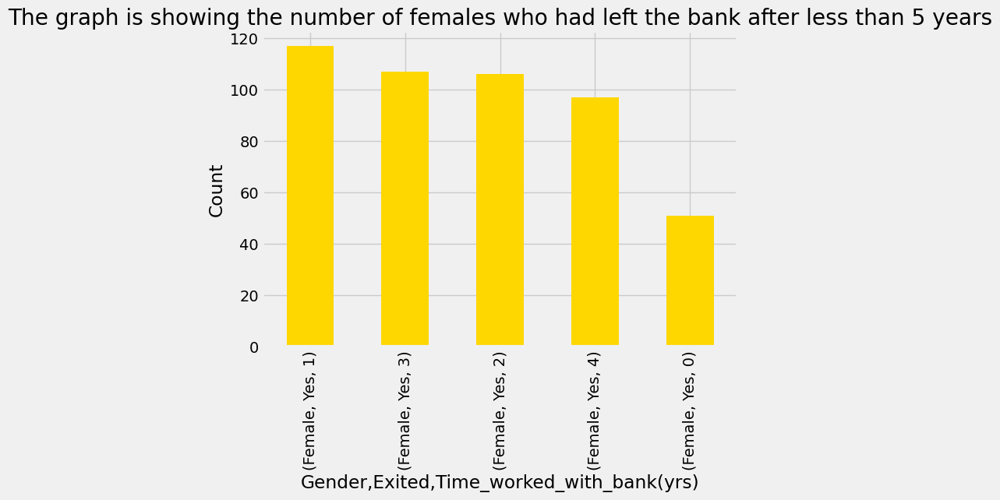

In [86]:
plt.figure(figsize=(7,5))
female_plt=churn_df.loc[female_exited2,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts()
ax=female_plt.plot(kind='bar',title='The graph is showing the number of females who had left the bank after less than 5 years',color='gold')
ax.set_ylabel('Count')
plt.show()

In [87]:
male_exited=(churn_df['Gender']=='Male') & (churn_df['Exited']=='Yes') 

In [88]:
churn_df.loc[male_exited,['Gender','Exited','Time_worked_with_bank(yrs)']]

,Gender,Exited,Time_worked_with_bank(yrs)
RowNumber,,,
6,Male,Yes,8
17,Male,Yes,1
54,Male,Yes,8
55,Male,Yes,1
71,Male,Yes,2
...,...,...,...
8877,Male,Yes,3
8879,Male,Yes,9
8881,Male,Yes,4


In [89]:
male_exited=(churn_df['Gender']=='Male') & (churn_df['Exited']=='Yes') &  (churn_df['Time_worked_with_bank(yrs)'] >=5)

In [90]:
churn_df.loc[male_exited,['Gender','Exited','Time_worked_with_bank(yrs)']]

,Gender,Exited,Time_worked_with_bank(yrs)
RowNumber,,,
6,Male,Yes,8
54,Male,Yes,8
110,Male,Yes,9
115,Male,Yes,9
126,Male,Yes,9
...,...,...,...
8864,Male,Yes,8
8871,Male,Yes,8
8879,Male,Yes,9


In [91]:
churn_df.loc[male_exited,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts()

Gender  Exited  Time_worked_with_bank(yrs)
Male    Yes     9                             95
                6                             85
                8                             83
                5                             79
                7                             67
                10                            29
Name: count, dtype: int64

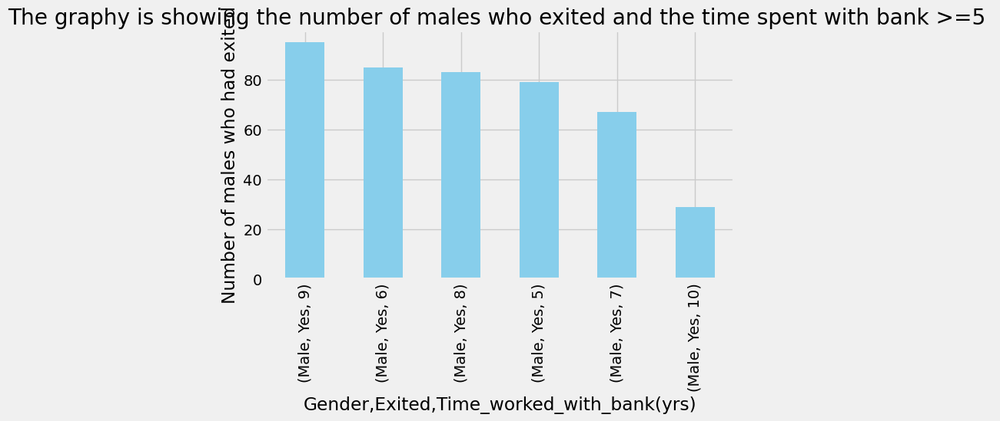

In [92]:
plt.figure(figsize=(7,4))
ax=churn_df.loc[male_exited,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts().plot(kind='bar',title='The graphy is showing the number of males who exited and the time spent with bank >=5 ',color='skyblue')
ax.set_ylabel('Number of males who had exited')
plt.show()

In [93]:
male_exited=(churn_df['Gender']=='Male') & (churn_df['Exited']=='Yes') &  (churn_df['Time_worked_with_bank(yrs)'] <5)
churn_df.loc[male_exited,['Gender','Exited','Time_worked_with_bank(yrs)']]

,Gender,Exited,Time_worked_with_bank(yrs)
RowNumber,,,
17,Male,Yes,1
55,Male,Yes,1
71,Male,Yes,2
87,Male,Yes,3
128,Male,Yes,0
...,...,...,...
8839,Male,Yes,0
8854,Male,Yes,3
8863,Male,Yes,2


In [94]:
male_plt=churn_df.loc[male_exited,['Gender','Exited','Time_worked_with_bank(yrs)']].value_counts()

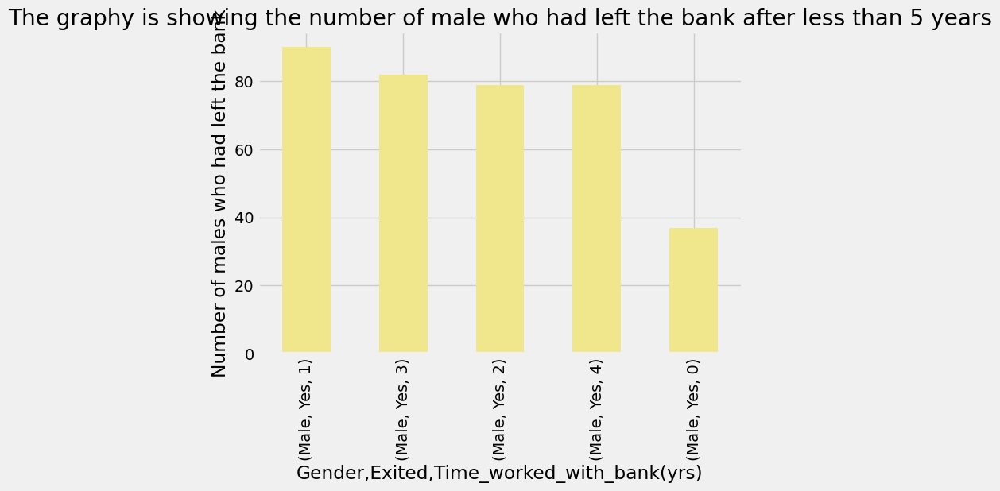

In [95]:
plt.figure(figsize=(7,5))
ax=male_plt.plot(kind='bar',color='khaki',title='The graphy is showing the number of male who had left the bank after less than 5 years')
ax.set_ylabel('Number of males who had left the bank')
plt.show()

In [97]:
churn_df['Exited'].value_counts(normalize=True)

Exited
No     0.793235
Yes    0.206765
Name: proportion, dtype: float64

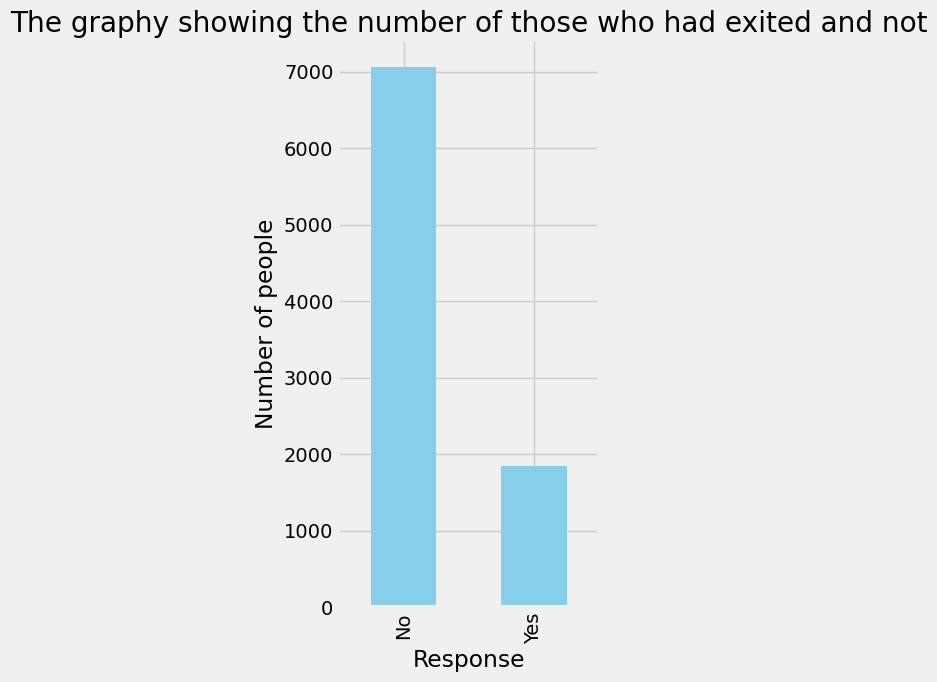

In [98]:
exited=churn_df['Exited'].value_counts()
plt.figure(figsize=(3,7))
ax=exited.plot(kind='bar',title='The graphy showing the number of those who had exited and not',color='skyblue')
ax.set_ylabel('Number of people')
ax.set_xlabel('Response')
plt.show()

In [99]:
exited_filter=(churn_df['Exited']=='Yes') & (churn_df['Time_worked_with_bank(yrs)'] >=5)

In [100]:
churn_df.loc[exited_filter,['Exited','Time_worked_with_bank(yrs)']]

,Exited,Time_worked_with_bank(yrs)
RowNumber,,
3,Yes,8
6,Yes,8
42,Yes,8
47,Yes,9
48,Yes,9
...,...,...
8871,Yes,8
8879,Yes,9
8888,Yes,8


In [101]:
churn_df.loc[exited_filter,['Exited','Time_worked_with_bank(yrs)']].value_counts()

Exited  Time_worked_with_bank(yrs)
Yes     9                             196
        5                             189
        8                             183
        6                             182
        7                             158
        10                             87
Name: count, dtype: int64

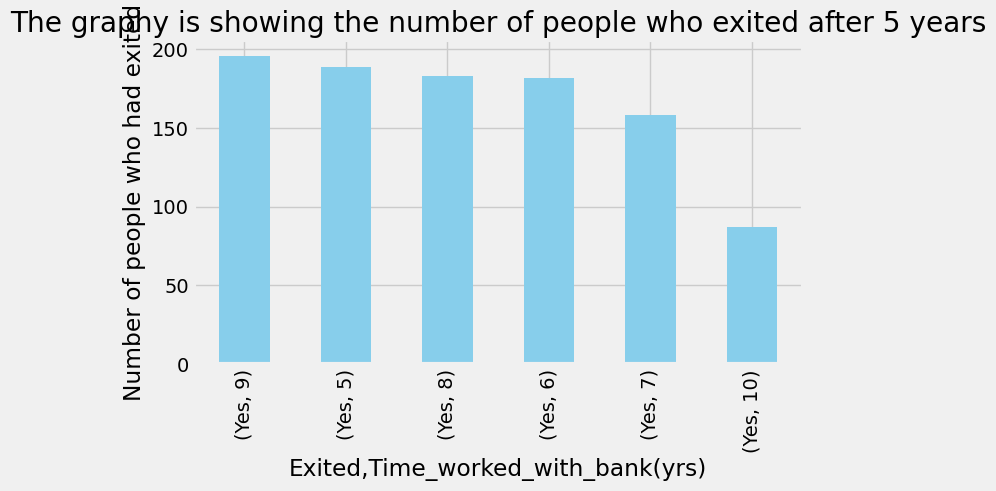

In [102]:
plt.figure(figsize=(7,4))
ax=churn_df.loc[exited_filter,['Exited','Time_worked_with_bank(yrs)']].value_counts().plot(kind='bar',title='The graphy is showing the number of people who exited after 5 years',color='skyblue')
ax.set_ylabel('Number of people who had exited')
plt.show()

In [103]:
churn_df['CreditScore'].describe()

count    8899.000000
mean      650.366558
std        96.863021
min       350.000000
25%       583.000000
50%       652.000000
75%       717.000000
max       850.000000
Name: CreditScore, dtype: float64

In [104]:
churn_df['Estimated_Salary'].describe()

count      8899.000000
mean     100218.509145
std       57502.444314
min          11.580000
25%       51112.970000
50%      100447.530000
75%      149409.870000
max      199992.480000
Name: Estimated_Salary, dtype: float64

In [105]:
churn_df.query('Estimated_Salary==11.580000')

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
2363,709,Germany,Male,45,4,122917.71,1,Yes,Yes,11.58,Yes


In [106]:
churn_df.query('CreditScore>500').style.background_gradient(cmap ='summer')

In [107]:
exited_credit_score=(churn_df['Exited']=='Yes') & (churn_df['CreditScore'] >=500) & (churn_df['Is_Active_Member']=='Yes') 

In [108]:
churn_df.loc[exited_credit_score,['CreditScore','Exited','Is_Active_Member']]

,CreditScore,Exited,Is_Active_Member
RowNumber,,,
47,829,Yes,Yes
48,637,Yes,Yes
91,647,Yes,Yes
105,670,Yes,Yes
106,622,Yes,Yes
...,...,...,...
8864,687,Yes,Yes
8871,668,Yes,Yes
8877,556,Yes,Yes


In [109]:
churn_df['Balance'].describe()

count      8899.000000
mean      76415.334069
std       62412.565096
min           0.000000
25%           0.000000
50%       97339.990000
75%      127640.395000
max      250898.090000
Name: Balance, dtype: float64

In [110]:
balance_filter=(churn_df['Balance']>=50000)  & (churn_df['Exited']=="Yes")

In [113]:
churn_df.loc[balance_filter].style.background_gradient(cmap ='winter')

In [117]:
churn_df.Country_lived.value_counts(normalize=True)

Country_lived
France     0.499607
Spain      0.250253
Germany    0.250140
Name: proportion, dtype: float64

In [119]:
country_pie=churn_df.Country_lived.value_counts(normalize=True)

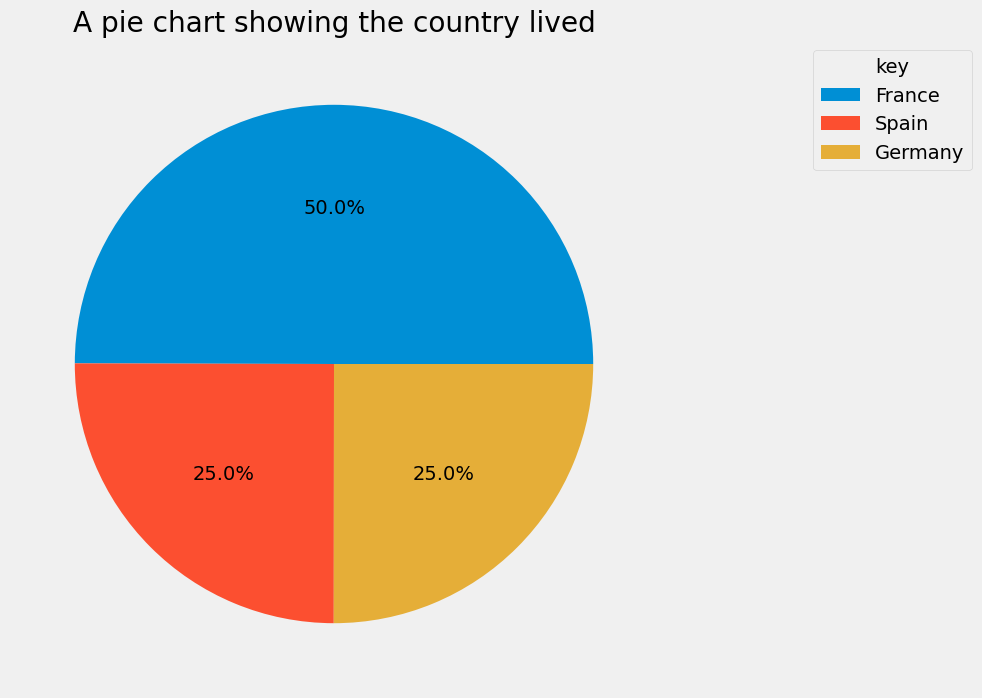

In [122]:
plt.figure(figsize=(10,8))
plt.pie(country_pie,autopct='%1.1f%%')
plt.title('A pie chart showing the country lived')
plt.legend(country_pie.index,title='key',loc='upper right')
plt.show()

In [123]:
churn_df.Age.describe()

count    8899.000000
mean       38.927632
std        10.464807
min        18.000000
25%        32.000000
50%        37.000000
75%        44.000000
max        92.000000
Name: Age, dtype: float64

In [124]:
churn_df.query('Age==92').style.background_gradient(cmap ='summer')

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
6444,753,France,Male,92,3,121513.310000,1,No,Yes,195563.990000,No
6760,705,France,Male,92,1,126076.240000,2,Yes,Yes,34436.830000,No


In [125]:
churn_df.query("Age==18").style.background_gradient(cmap ='coolwarm')

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
747,844,France,Male,18,2,160980.030000,1,No,No,145936.280000,No
1620,656,France,Male,18,10,151762.740000,1,No,Yes,127014.320000,No
1679,570,France,Female,18,4,82767.420000,1,Yes,No,71811.900000,No
2022,716,Germany,Female,18,3,128743.800000,1,No,No,197322.130000,No
2137,727,France,Male,18,4,133550.670000,1,Yes,Yes,46941.410000,No
2142,674,France,Male,18,7,0.000000,2,Yes,Yes,55753.120000,Yes
3331,738,France,Male,18,4,0.000000,2,Yes,Yes,47799.150000,No
3513,806,Spain,Male,18,3,0.000000,2,Yes,Yes,86994.540000,No
3518,771,Spain,Male,18,1,0.000000,2,No,No,41542.950000,No


In [126]:
churn_df.Products_Obtained_through_bank.value_counts(normalize=True)

Products_Obtained_through_bank
1    0.507023
2    0.459715
3    0.027419
4    0.005843
Name: proportion, dtype: float64

In [127]:
pie_chart=churn_df.Products_Obtained_through_bank.value_counts(normalize=True)

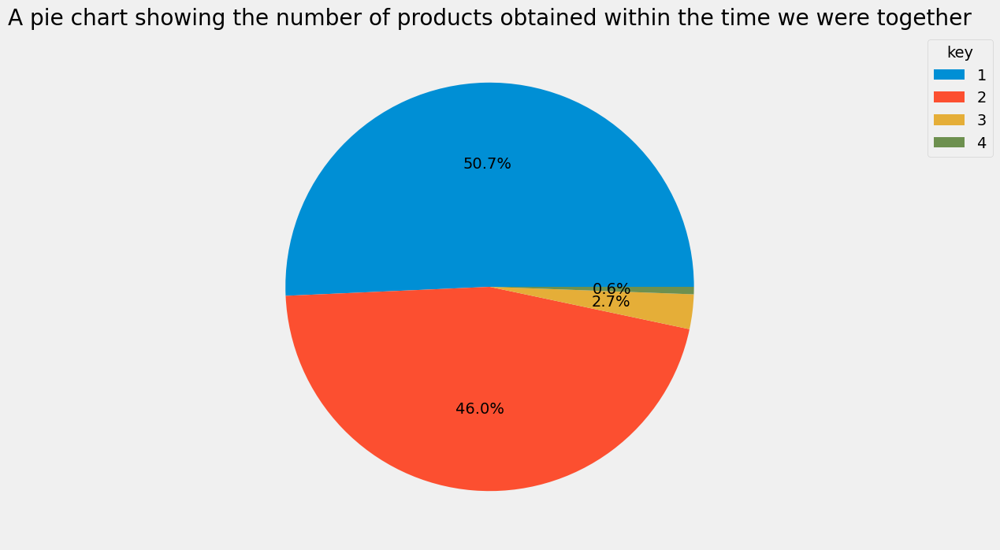

In [128]:
plt.figure(figsize=(20,8))
plt.pie(pie_chart,autopct='%1.1f%%')
plt.title('A pie chart showing the number of products obtained within the time we were together')
plt.legend(pie_chart.index,title='key',loc='upper right')
plt.show()

In [129]:
churn_df.sort_values(by=['Age','Balance','Time_worked_with_bank(yrs)']).head(20)  # by  default it takes all as True

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
3518,771,Spain,Male,18,1,0.00,2,No,No,41542.95,No
3513,806,Spain,Male,18,3,0.00,2,Yes,Yes,86994.54,No
3331,738,France,Male,18,4,0.00,2,Yes,Yes,47799.15,No
7335,616,France,Male,18,6,0.00,2,Yes,Yes,27308.58,No
2142,674,France,Male,18,7,0.00,2,Yes,Yes,55753.12,Yes
8523,644,Spain,Male,18,8,0.00,2,Yes,No,59172.42,No
4717,646,France,Male,18,10,0.00,2,No,Yes,52795.15,No
1679,570,France,Female,18,4,82767.42,1,Yes,No,71811.90,No
7723,684,Germany,Male,18,9,90544.00,1,No,Yes,4777.23,No


In [130]:
churn_df['Age'].nlargest(10)

RowNumber
6444    92
6760    92
2459    88
3034    85
3388    84
3532    84
767     82
4932    81
7527    81
7957    81
Name: Age, dtype: int64

In [131]:
churn_df.nlargest(10,'Balance')

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
2093,655,Spain,Male,38,3,250898.09,3,No,Yes,81054.00,Yes
3281,583,France,Female,57,3,238387.56,1,No,Yes,147964.99,Yes
8734,749,Spain,Male,42,9,222267.63,1,No,No,101108.85,Yes
3589,489,Spain,Male,40,3,221532.80,1,Yes,No,171867.08,No
6718,663,Spain,Female,58,5,216109.88,1,No,Yes,74176.71,Yes
1068,650,Germany,Male,26,4,214346.96,2,Yes,No,128815.33,No
139,584,Spain,Female,48,2,213146.20,1,Yes,No,75161.25,Yes
1534,850,France,Female,37,3,212778.20,1,No,Yes,69372.88,No
3921,634,Germany,Male,43,3,212696.32,1,Yes,No,115268.86,No


In [132]:
churn_df['Balance'].sum().round(2)

680020057.88

In [133]:
exit3 = (churn_df['Exited']=='Yes')

In [134]:
# calculating the total loss 
churn_df.loc[exit3,['Balance']].sum()

Balance    1.681137e+08
dtype: float64

In [136]:
churn_df['Is_Active_Member'].value_counts(normalize=True)

Is_Active_Member
Yes    0.513428
No     0.486572
Name: proportion, dtype: float64

In [137]:
churn_df['Has_CrCard'].value_counts(normalize=True)

Has_CrCard
Yes    0.702101
No     0.297899
Name: proportion, dtype: float64

In [138]:
country_group=churn_df.groupby('Country_lived')

In [139]:
country_group.get_group('France').style.background_gradient(cmap = 'viridis')

In [142]:
country_exited=(churn_df['Country_lived']=='France') & (churn_df['Exited']=='Yes')

In [164]:
country_exited.value_counts()

False    8160
True      739
Name: count, dtype: int64

In [165]:
country_exited1=(churn_df['Country_lived']=='Germany') & (churn_df['Exited']=='Yes')

In [166]:
country_exited1.value_counts()

False    8174
True      725
Name: count, dtype: int64

In [167]:
country_exited2=(churn_df['Country_lived']=='Spain') & (churn_df['Exited']=='Yes')

In [168]:
country_exited2.value_counts()
# False -No 
# True -Yes

False    8523
True      376
Name: count, dtype: int64

# Checking for Multicolinearity

## Finding the correlation of the numerical variables using the PPM and Spearman

In [205]:
pearson_correlation_matrix = churn_df[['CreditScore','Age','Time_worked_with_bank(yrs)','Balance','Products_Obtained_through_bank','Estimated_Salary']].corr()

In [207]:
pearson_correlation_matrix.style.background_gradient(cmap = 'viridis')

,CreditScore,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Estimated_Salary
CreditScore,1.000000,-0.005572,-0.002978,0.005748,0.006974,-0.000592
Age,-0.005572,1.000000,-0.006903,0.026995,-0.032123,-0.003489
Time_worked_with_bank(yrs),-0.002978,-0.006903,1.000000,-0.012605,0.009540,0.004056
Balance,0.005748,0.026995,-0.012605,1.000000,-0.302585,0.017301
Products_Obtained_through_bank,0.006974,-0.032123,0.009540,-0.302585,1.000000,0.013623
Estimated_Salary,-0.000592,-0.003489,0.004056,0.017301,0.013623,1.000000


In [209]:
#plt.figure(figsize = (7,5))
#heatmap = sns.heatmap(pearson_correlation_matrix,annot=True,cmap='viridis',fmt='2f')
#plt.title('Pearson Product Moment Correlation Cofficient')
#plt.show()

In [211]:
spearman_correlation_matrix=churn_df[['CreditScore','Age','Time_worked_with_bank(yrs)','Balance','Products_Obtained_through_bank','Estimated_Salary']].corr(method='spearman')

In [213]:
spearman_correlation_matrix.style.background_gradient(cmap ='summer')

,CreditScore,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Estimated_Salary
CreditScore,1.000000,-0.007710,-0.002108,0.007549,0.006405,0.002077
Age,-0.007710,1.000000,-0.008722,0.032039,-0.060824,0.000686
Time_worked_with_bank(yrs),-0.002108,-0.008722,1.000000,-0.009776,0.009078,0.003948
Balance,0.007549,0.032039,-0.009776,1.000000,-0.314721,0.015978
Products_Obtained_through_bank,0.006405,-0.060824,0.009078,-0.314721,1.000000,0.011258
Estimated_Salary,0.002077,0.000686,0.003948,0.015978,0.011258,1.000000


In [214]:
#plt.figure(figsize=(7,5))
#heatmap=sns.heatmap(spearman_correlation_matrix,annot=True,cmap='plasma',fmt='2f') 
#plt.title('Spearman Rank Cofficient')
#plt.show()
#cmap- is a color map used for visualisation it includes coolwarm,viridis,inferno,plasma, Greens,Blues,Reds,autumn,spring,winter,summer,civids
# fmt allows to specify the format  of numeric values displayed in annotation

# Hypothesis Test

##### categories of interest : gender and exited

In [219]:
category1=churn_df[['Gender','Exited']] 

##### see how the contingency table will look like

In [222]:
category1.value_counts()

Gender  Exited
Male    No        4035
Female  No        3024
        Yes       1035
Male    Yes        805
Name: count, dtype: int64

##### creating a contigency table

In [225]:
category1_chi1=pd.crosstab(index=churn_df['Gender'],columns=churn_df['Exited'])

In [227]:
category1_chi1

Exited,No,Yes
Gender,,
Female,3024,1035
Male,4035,805


#### Defining the null and alternative hypothesis

##### H0 : There is no association of gender for the exit of our customers 
##### H1 : There is association of gender for the exit of our customers

#### Rejection criteria
##### we reject the null hypothesis if p_value > alpha

In [233]:
scores=chi2_contingency(category1_chi1)

In [234]:
scores

Chi2ContingencyResult(statistic=105.27934378089837, pvalue=1.0607619594467797e-24, dof=1, expected_freq=array([[3219.74165637,  839.25834363],
       [3839.25834363, 1000.74165637]]))

In [235]:
stats,p_value,a,b=scores

## Decision Rule:

In [240]:
alpha = 0.05

if p_value>alpha:
    print(f'with p_value of {p_value} we reject H0 and can conclude with a confidence of 95% that ')
    print('there is dependence between the gender and exited')
else:
    print(f' with p_value of {p_value} we fail to reject the H0 and conclude with a ')
    print('confidence of 95% that there is independence between the gender and exited')

 with p_value of 1.0607619594467797e-24 we fail to reject the H0 and conclude with a 
confidence of 95% that there is independence between the gender and exited


### 2 categories of interest from the dataset : has a credit card and exited

In [245]:
category2=churn_df[['Has_CrCard','Exited']]

#####  see how the contigency table will look like

In [248]:
category2.value_counts()

Has_CrCard  Exited
Yes         No        4956
No          No        2103
Yes         Yes       1292
No          Yes        548
Name: count, dtype: int64

### creating a contigency table

In [251]:
category2=pd.crosstab(index=churn_df['Has_CrCard'],columns=churn_df['Exited'])

In [253]:
category2

Exited,No,Yes
Has_CrCard,,
No,2103,548
Yes,4956,1292


#### Defining the null hypothesis and the alternative
###### H0 : There is no association between having a credit card and exited from the bank
###### H1 :  There is association between having a credit card and exited from the bank

#### Rejection criteria
###### we reject the null hypothesis if the p_value > alpha

Calculating the chi-squared value , p value,expected values and degree of freedom

In [260]:
scores2=chi2_contingency(category2)

In [262]:
scores2

Chi2ContingencyResult(statistic=0.0, pvalue=1.0, dof=1, expected_freq=array([[2102.86650185,  548.13349815],
       [4956.13349815, 1291.86650185]]))

In [264]:
stats,p_value,c,d=scores2

#### Decision Rule:

In [267]:
alpha=0.05

if p_value>alpha:
    print(f'with p_value as {p_value} we reject H0 and can conclude with a ')
    print('confidence of 95% that there is dependence between having a credit card and exited')
    print(f"when alpha = {alpha}")
else:
    print(f'with p_value as {p_value} we fail to reject the null hypothesis and conclude with a ')
    print('confidence of 95% that there is independence between having a credit card and exited')

with p_value as 1.0 we reject H0 and can conclude with a 
confidence of 95% that there is dependence between having a credit card and exited
when alpha = 0.05


##### 2 categories of interest : has a exited and is active member

In [272]:
category3=churn_df[['Is_Active_Member','Exited']] 

##### see how the contigency table will look like

In [275]:
category3.value_counts() 

Is_Active_Member  Exited
Yes               No        3914
No                No        3145
                  Yes       1185
Yes               Yes        655
Name: count, dtype: int64

##### creating a contigency table

In [278]:
category3=pd.crosstab(index=churn_df['Is_Active_Member'],columns=churn_df['Exited'])

In [280]:
category3

Exited,No,Yes
Is_Active_Member,,
No,3145,1185
Yes,3914,655


### Defining the null hypothesis and the alternative
##### H0 : There is no association between  being an active member and exited from the bank
##### H1 : There is association between being an active member and exited from the bank

#### Rejection criteria
##### we reject the null hypothesis if p_value > alpha

### Test statistic
calculating a chi-squared value , p_value ,degree of freedom and the expected values

In [287]:
scores3=chi2_contingency(category3)

In [289]:
scores3

Chi2ContingencyResult(statistic=229.39045835830734, pvalue=8.096069030797801e-52, dof=1, expected_freq=array([[3434.7083942,  895.2916058],
       [3624.2916058,  944.7083942]]))

In [291]:
stats,p_value,e,f=scores3

### Decision Rule:

In [294]:
alpha=0.05
if p_value>alpha:
    print('There is a significant relationship between being an active member to the bank and exited with 95% ')
    print(f'level of confidence for the p value of {p_value}')
    print("therefore we are rejecting H0")
    
else:
    print("The relationship between being an active member to the bank and exited from it with 95 % ")
    print(f'level of confidence when p_value is {p_value} is insignificant')
    print("therefore we are failing to reject the null hypothesis")

The relationship between being an active member to the bank and exited from it with 95 % 
level of confidence when p_value is 8.096069030797801e-52 is insignificant
therefore we are failing to reject the null hypothesis


#### variables of interest : country lived and exited

In [299]:
country_lived=churn_df[['Country_lived','Exited']]

In [301]:
country_lived.value_counts()

Country_lived  Exited
France         No        3707
Spain          No        1851
Germany        No        1501
France         Yes        739
Germany        Yes        725
Spain          Yes        376
Name: count, dtype: int64

####  creating a contingency table

In [304]:
country_lived=pd.crosstab(index=churn_df['Country_lived'],columns=churn_df['Exited'])
country_lived

Exited,No,Yes
Country_lived,,
France,3707,739
Germany,1501,725
Spain,1851,376


#### Defining the null hypothesis and the alternative hypothesis

H0 : The relationship between the country lived and being exited is  insignifiant,there is no dependence    
H1 :There is significant relationship between the country lived and being exited

##### Rejection criteria
##### we reject null hypothesis if p_value > alpha

calculating the chi-squared value,p_value,degree of freedom and expected values

In [311]:
score4=chi2_contingency(country_lived)

In [312]:
score4

Chi2ContingencyResult(statistic=256.07422810710625, pvalue=2.4784940903582545e-56, dof=2, expected_freq=array([[3526.72367682,  919.27632318],
       [1765.74154399,  460.25845601],
       [1766.53477919,  460.46522081]]))

In [315]:
stats,p_value,g,h=score4

#### Decision Rule:

In [318]:
alpha=0.05
if p_value>alpha:
    print('There is a significant relationship between the country lived and being exited from the bank with a ')
    print(f'95% level of confidence at {p_value}')

else:
    print("There is independence relationship between the country lived and being exited from the bank with ")
    print(f"95 % level of confidence at a p_value of {p_value}")
          

There is independence relationship between the country lived and being exited from the bank with 
95 % level of confidence at a p_value of 2.4784940903582545e-56


##### 2 variables of interest : time spent with the bank and exited

In [323]:
time=churn_df[['Time_worked_with_bank(yrs)','Exited']]

In [325]:
time.value_counts()

Time_worked_with_bank(yrs)  Exited
7                           No        761
2                           No        748
8                           No        738
3                           No        718
1                           No        711
5                           No        704
4                           No        702
6                           No        687
9                           No        677
10                          No        333
0                           No        280
1                           Yes       207
9                           Yes       196
5                           Yes       189
3                           Yes       189
2                           Yes       185
8                           Yes       183
6                           Yes       182
4                           Yes       176
7                           Yes       158
0                           Yes        88
10                          Yes        87
Name: count, dtype: int64

Creating a contingency table

In [328]:
#creating a  contingency table
time=pd.crosstab(index=churn_df['Time_worked_with_bank(yrs)'],columns=churn_df['Exited'])

In [330]:
time

Exited,No,Yes
Time_worked_with_bank(yrs),,
0,280,88
1,711,207
2,748,185
3,718,189
4,702,176
5,704,189
6,687,182
7,761,158
8,738,183


#### Defining the null hypothesis and the alternative hypothesis
##### H0 : There is no asssociation between the time spent by our customers and being exited from us
##### H1 : There is association between the time spent by the customers and exited

#### Rejection criteria:
##### we reject the null hypothesis if the p_value > alpha

calculating the chi-squared value,p_value,degree of freedom and expected values

In [337]:
score5=chi2_contingency(time)
score5

Chi2ContingencyResult(statistic=13.960439609412559, pvalue=0.1748037402050031, dof=10, expected_freq=array([[291.91055175,  76.08944825],
       [728.18990898, 189.81009102],
       [740.0884369 , 192.9115631 ],
       [719.46432183, 187.53567817],
       [696.46050118, 181.53949882],
       [708.3590291 , 184.6409709 ],
       [689.32138443, 179.67861557],
       [728.98314417, 190.01685583],
       [730.56961456, 190.43038544],
       [692.49432521, 180.50567479],
       [333.15878189,  86.84121811]]))

In [339]:
stats,p_value,h,i=score5

#### Decision Rule:

In [342]:
alpha=0.05
if p_value>alpha:
    print('There is significant relationship between the time spent as a customer and ')
    print(f'exited from the bank with 95% level of confidence at pvalue {p_value}')
    
    
else:
    print('we fail to reject the null hypothesis and conclude that there is insignificant linear relationship between ')
    print(f'the time taken as a customer to the bank and being exited from it with a 95% level of confidence at  {p_value}')

There is significant relationship between the time spent as a customer and 
exited from the bank with 95% level of confidence at pvalue 0.1748037402050031


#### Variables of interest  : Products_Obtained_through_bank and Exited

In [347]:
property_obtained=churn_df[['Products_Obtained_through_bank','Exited']]

In [349]:
property_obtained.value_counts()

Products_Obtained_through_bank  Exited
2                               No        3781
1                               No        3238
                                Yes       1274
2                               Yes        310
3                               Yes        204
4                               Yes         52
3                               No          40
Name: count, dtype: int64

#####  creating a contingency table

In [352]:
property_obtained = pd.crosstab(index=churn_df['Products_Obtained_through_bank'],columns=churn_df['Exited'])

In [353]:
property_obtained

Exited,No,Yes
Products_Obtained_through_bank,,
1,3238,1274
2,3781,310
3,40,204
4,0,52


#### Defining the null hypothesis and the alternative hypothesis
##### H0 : There is no association between the  products obtained through the bank and exited
##### H1 : There is association between the products obtained through the bank and exited 

#### Rejection criteria
##### we reject the null hypothesis if the p_value > alpha

calculating the chi-squared value,p_value,degree of freedom and expected values

In [361]:
score6=chi2_contingency(property_obtained)
score6

Chi2ContingencyResult(statistic=1373.8231128634525, pvalue=1.4103364604583396e-297, dof=3, expected_freq=array([[3579.07719969,  932.92280031],
       [3245.1251826 ,  845.8748174 ],
       [ 193.54938757,   50.45061243],
       [  41.24823014,   10.75176986]]))

In [363]:
stats,p_value,j,k=score6

#### Decision  Rule:

In [366]:
alpha=0.05
if p_value<alpha:
    print('We accept the the null hypothesis and conclude that there is no significant relationship between ')
    print(f'the number of property obtained and being exited from the bank at {p_value} with a 95% level of confidence')
    
else:
    print('We reject the null hypothesis and conclude that there is significant relationship between ')
    print(f'the number of property obtained and being exited from it at {p_value} with 95% level of confidence')

We accept the the null hypothesis and conclude that there is no significant relationship between 
the number of property obtained and being exited from the bank at 1.4103364604583396e-297 with a 95% level of confidence


##### Variables of interest : gender and active member

creating a contingency table

In [373]:
is_act_member=pd.crosstab(index=churn_df['Gender'],columns=churn_df['Is_Active_Member'])

In [374]:
is_act_member

Is_Active_Member,No,Yes
Gender,,
Female,2023,2036
Male,2307,2533


#### Defining the null hypothesis and the alternative hypothesis
###### H0 : There is no association between gender and being an active member
######  H1 : There is  association between the gender and being an active member

##### Rejection criteria
###### we reject the null hypothesis if p_value > alpha

 calculating the chi-squared value,p_value,degree of freedom and expected values

In [381]:
score7=chi2_contingency(is_act_member)
score7

Chi2ContingencyResult(statistic=4.092139039635724, pvalue=0.04308308567728886, dof=1, expected_freq=array([[1974.99381953, 2084.00618047],
       [2355.00618047, 2484.99381953]]))

In [383]:
stats,p_value,x,y=score7

#### Decision Rule:

In [386]:
alpha=0.05
if p_value>alpha:
    print('We reject the null hypothesis and conclude that there is a significant linear relationship between ')
    print(f'gender and being an active member for the bank at {p_value} with a 95% level of confidence')
    
else:
    print('We fail to reject the null hypothesis and conclude that there is insignificant linear ')
    print(f'relationship between being an active member and gender with 95% level of confidennce at {p_value}')

We fail to reject the null hypothesis and conclude that there is insignificant linear 
relationship between being an active member and gender with 95% level of confidennce at 0.04308308567728886


In [389]:
churn_df

,CreditScore,Country_lived,Gender,Age,Time_worked_with_bank(yrs),Balance,Products_Obtained_through_bank,Has_CrCard,Is_Active_Member,Estimated_Salary,Exited
RowNumber,,,,,,,,,,,
2,608,Spain,Female,41,1,83807.86,1,No,Yes,112542.58,No
3,502,France,Female,42,8,159660.80,3,Yes,No,113931.57,Yes
4,699,France,Female,39,1,0.00,2,No,No,93826.63,No
5,850,Spain,Female,43,2,125510.82,1,Yes,Yes,79084.10,No
6,645,Spain,Male,44,8,113755.78,2,Yes,No,149756.71,Yes
...,...,...,...,...,...,...,...,...,...,...,...
8896,699,France,Female,40,8,122038.34,1,Yes,No,102085.35,No
8897,712,France,Male,34,1,0.00,2,Yes,Yes,195052.12,No
8898,603,France,Male,51,8,186825.57,1,Yes,No,93739.71,Yes


####  ___________________________________________________END______________________________________________________